# Problem statement is :
#### Credit Card Data Analysis

Happy Customer Bank is a mid-sized private bank that deals in all kinds of banking products, like Savings accounts, Current accounts, investment products, credit products, among other offerings.
 
The bank also cross-sells products to its existing customers and to do so they use different kinds of communication like tele-calling, e-mails, recommendations on net banking, mobile banking, etc. 
 
In this case, *the Happy Customer Bank wants to cross sell its credit cards to its existing customers. The bank has identified a set of customers that are eligible for taking these credit cards.*
 
Now, **the bank is looking for your help in identifying the patterns and analyse the dataset, given:
Customer details (gender, age, region etc.)
Details of his/her relationship with the bank (Channel_Code,Vintage, 'Avg_Asset_Value etc.)**

In [1]:
'''Importing important libraries'''
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import warnings
warnings.filterwarnings('ignore')

# Exploratory Data Analysis:

In [5]:
data = pd.read_csv(r"D:\Analytcs Vidhya\Projects\2021-08-18 22.07.47 Amandeep Singh's Zoom Meeting 75938318680\EDA Project 1\Data.csv") # reading the data
data

,ID,Gender,Age,Region_Code,Occupation,Channel_Code,Vintage,Credit_Product,Avg_Account_Balance,Is_Active,Is_Lead
0,NNVBBKZB,Female,73,RG268,Other,X3,43,No,1045696,No,0
1,IDD62UNG,Female,30,RG277,Salaried,X1,32,No,581988,No,0
2,HD3DSEMC,Female,56,RG268,Self_Employed,X3,26,No,1484315,Yes,0
3,BF3NC7KV,Male,34,RG270,Salaried,X1,19,No,470454,No,0
4,TEASRWXV,Female,30,RG282,Salaried,X1,33,No,886787,No,0
...,...,...,...,...,...,...,...,...,...,...,...
245720,BPAWWXZN,Male,51,RG284,Self_Employed,X3,109,NaN,1925586,No,0
245721,HFNB7JY8,Male,27,RG268,Salaried,X1,15,No,862952,Yes,0
245722,GEHAUCWT,Female,26,RG281,Salaried,X1,13,No,670659,No,0
245723,GE7V8SAH,Female,28,RG273,Salaried,X1,31,No,407504,No,0


**Looking at the dimensions of the data**:

In [3]:
print(f"The number of rows in the data are {data.shape[0]}\nThe number of column in the data are {data.shape[1]}")

The number of rows in the data are 245725
The number of column in the data are 11


We see that there are **245725 rows** and **11 columns** in the dataset

**Looking at the columns in the data**

In [4]:
data.columns

Index(['ID', 'Gender', 'Age', 'Region_Code', 'Occupation', 'Channel_Code',
       'Vintage', 'Credit_Product', 'Avg_Account_Balance', 'Is_Active',
       'Is_Lead'],
      dtype='object')

**Description for the Variables:**
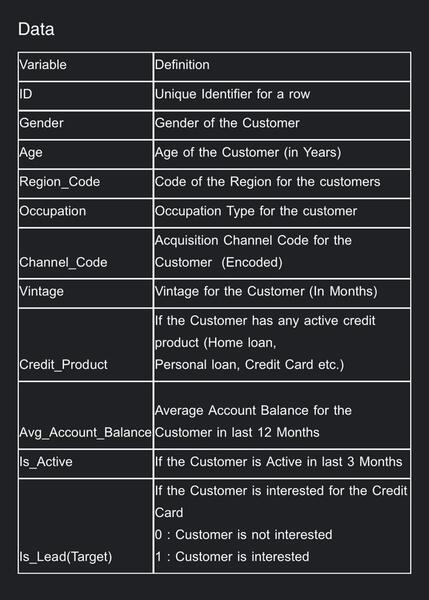

From the above description, we see that the column **Is_Lead is the target variable** which gives us the description about the interest of the customer in taking the Credit Card. During this EDA, we will see how the rest of the features effect the target variable Is_Lead. The descriptions for the other variables is given as well.

#### Looking at the data types of the columns:

In [5]:
data.dtypes

ID                     object
Gender                 object
Age                     int64
Region_Code            object
Occupation             object
Channel_Code           object
Vintage                 int64
Credit_Product         object
Avg_Account_Balance     int64
Is_Active              object
Is_Lead                 int64
dtype: object

By looking at the data types of the features, we get some insights from them:
* Feature 'Gender' tells us about the gender of the customer. **This column can be typecasted to the categorical dtype.**
* 'Region_Code' is the unique code given to each region. Hence, **column will also be typecasted to the categorical dtype.**
* Similarly **'Occupation' and 'Channel_Code' will also be typecasted to categorical dtype.**
* *'Category_Product'* tells us if the person has any active loan or not. Similarly *'Is_active'* tells us if the customer has been active n the last 3 months or not. **Both of these columns are of a categorical type.**
* **'Is_Lead' is the target column which is given as the int data type.** *The value 1 means that the customer is interested in the credit card. 0 mean there is no interest.* ***So we will typecast this column into the categorical data type.***

In [6]:
"""To leave the original data unchanged, we are making a copy of the data and working with that."""
ds = data.copy()

# Typecasting the column to the appropriate data type.
ds['Gender'] = ds['Gender'].astype('category')
ds['Region_Code'] = ds['Region_Code'].astype('category')
ds['Occupation'] = ds['Occupation'].astype('category')
ds['Channel_Code'] = ds['Channel_Code'].astype('category')
ds['Credit_Product'] = ds['Credit_Product'].astype('category')
ds['Is_Active'] = ds['Is_Active'].astype('category')
ds['Is_Lead'] = ds['Is_Lead'].astype('category')

Since the data type of the columns have been corrected, we can now segregate the categorical columns and the numerical columns.

In [7]:
cat_col = list(ds.select_dtypes(include = 'category').columns)
num_col = list(ds.select_dtypes(include = 'int64').columns)
print(f"Total categorical columns in the data: {len(cat_col)}\nTotal numerical columns in the data: {len(num_col)}")

Total categorical columns in the data: 7
Total numerical columns in the data: 3


**Looking at the number of unique values in the unique data**:

In [8]:
print("Number of unique values in each column")
data.nunique()

Number of unique values in each column


ID                     245725
Gender                      2
Age                        63
Region_Code                35
Occupation                  4
Channel_Code                4
Vintage                    66
Credit_Product              2
Avg_Account_Balance    135292
Is_Active                   2
Is_Lead                     2
dtype: int64

As we see from the above values that the number of unique values and from the description that the ID column has a unique value for each attribute. So, we can remove this column from the dataset as it will not help us in the analysis of the data.

In [9]:
ds.drop(['ID'], axis = 1, inplace = True)

**Checking the nullvalues in the columns**:

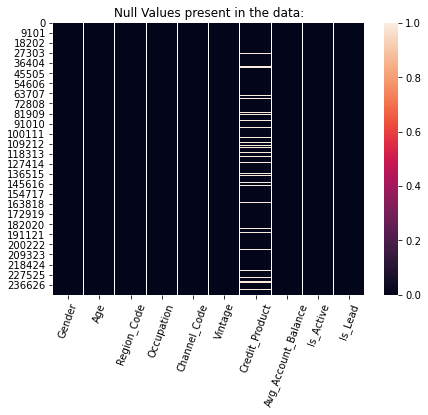

In [10]:
plt.figure(figsize = (7, 5))
plt.title("Null Values present in the data:")
sns.heatmap(ds.isnull())
plt.xticks(rotation = 70)
plt.show()

In [11]:
print("Null values in the data")
ds.isnull().sum()

Null values in the data


Gender                     0
Age                        0
Region_Code                0
Occupation                 0
Channel_Code               0
Vintage                    0
Credit_Product         29325
Avg_Account_Balance        0
Is_Active                  0
Is_Lead                    0
dtype: int64

From both the heatmap and values, we see that the column 'Credit_Product' has some null values present in it. Since we know that this column has only 2 unique values, Yes and No, we can make a third value Unknown to replace the null values. So, we will replace this values will the string "Unknown" in the column.

In [12]:
ds['Credit_Product'].value_counts()

No     144357
Yes     72043
Name: Credit_Product, dtype: int64

In [13]:
# or .replace(np.nan, "Unknown")
ds['Credit_Product'] = ds['Credit_Product'].cat.add_categories('Unknown')
ds['Credit_Product'].fillna("Unknown", inplace = True)

## Univariate Analysis of the Numerical Columns:
Now we look at each and every numerical column one by one and then we try to draw the insights from them. First of all we have a look at the distribution of the numerical variables.

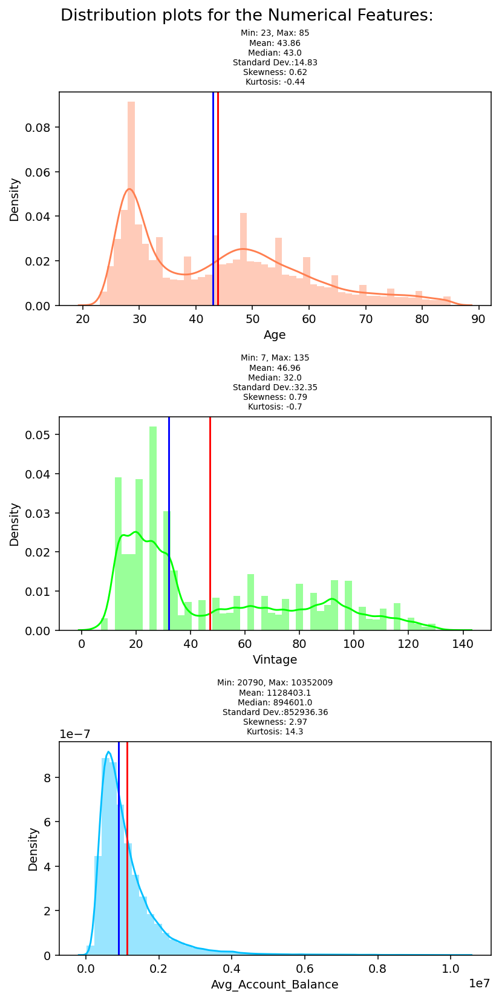

In [14]:
num_colour = ['coral', 'lime', 'deepskyblue']
plt.figure(figsize = (6, 4*len(num_col)), dpi = 140)
# plt.suptitle("Distribution plots for the Numerical Features:", fontsize = 18)
for i in range(0, len(num_col)):

# Calculating the central tendency and spread of the data.
    min_val = ds[num_col[i]].min()
    max_val = ds[num_col[i]].max()
    rang = max_val-min_val
    mean_val = ds[num_col[i]].mean()
    median_val = ds[num_col[i]].median()
    st_dev = ds[num_col[i]].std()
    skew_val = ds[num_col[i]].skew()
    kurt_val = ds[num_col[i]].kurtosis()
    
# Ploting the distribution plots
    plt.suptitle("Distribution plots for the Numerical Features: ", fontsize = 14)
    plt.subplot(len(num_col), 1, i+1)
    sns.distplot(ds[num_col[i]], color = num_colour[i])
    plt.axvline(mean_val, color = 'red', label = 'Mean')
    plt.axvline(median_val, color = 'b', label = 'Median')
    plt.title(f"Min: {min_val}, Max: {max_val}\nMean: {round(mean_val, 2)}\nMedian: {median_val}"
              f"\nStandard Dev.:{round(st_dev, 2)}\nSkewness: {round(skew_val, 2)}\nKurtosis: {round(kurt_val, 2)}", 
              fontsize = 7)

plt.tight_layout()
plt.show()

From the above distribution plots, we get some insights about the data:
* **Age**:
    1. For the complete data, **the majority of customers fall between the ages 20-35 years.**
    2. We see that **the median and average age is approxiamltely equal to the 43.**
    3. Also, **the skewness of the column is 0.618.**
    4. From points 2 and 3, we get the insights that **the data is the column is normally distributed.**
    5. We can also say by looking at the data that **the outliers may not be preset in the 'Age' column.** We will check it using the boxplots ahead
* **Vintage**:
    1. The **longest** that the customer has been with the bank is **135 months**. The **newest** customer joined the bank **7 months ago**.
    2. We see that the **mean of the column is 47 and the median is 32**, which suggests right skewness.
    3. Alsom the **skewness of the column is 0.79**, so the column is positive skewed. We can say that *the values in the column are slightly biased towards the old customers.*
    4. **Majority of the customers of the bank are between 10 to 38 months old.**
    5. Kurtosis value for the column is -0.696, which suggests *some outliers may be present in the data.*
* **Avg_Account_Balance**:
    1. We see that **the range of the column is very large.** The maximum average account balance is 10352009 whereas the lowest account balance is 20790. **The data in this column is very largely spread.**
    2. So, it is very clear that the standard deviation is also very large.
    3. The column is highly skewed with the **skewness of 2.97**. *It is biased towards the higher account balance.*
    4. Kurtosis value which is 14.3 also indicates that **there are extereme outliers present in the data**. *We will see their effect on the target variable ahead.*

Now, we have a look at the boxplots of the numerical columns to look at the outliers in the data. We will identify the outliers in each column.

In [15]:
plt.style.use('ggplot')

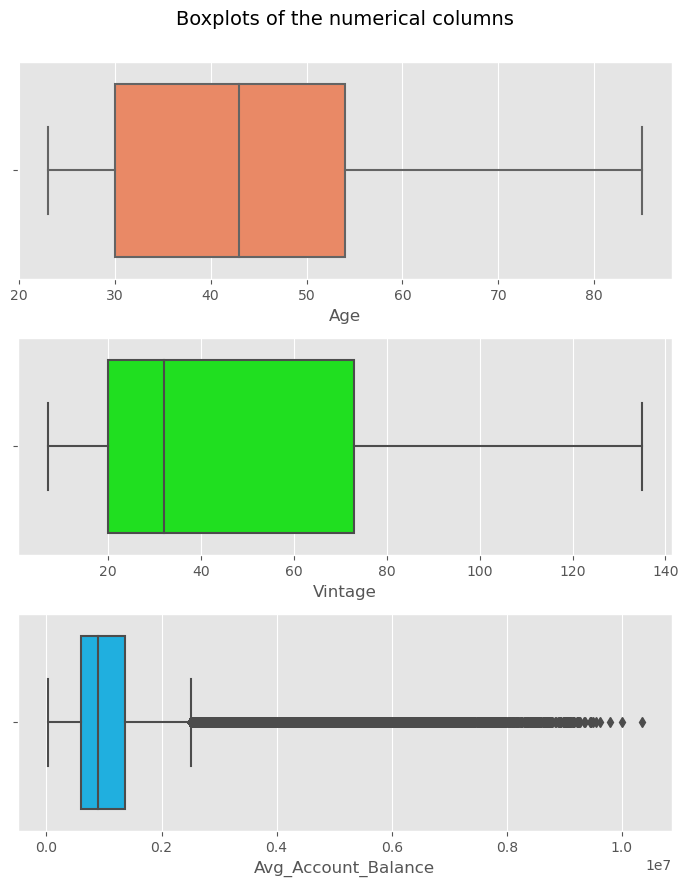

In [16]:
plt.figure(figsize = (7, 3*len(num_col)), dpi = 100)
for i in range(0, len(num_col)):
    plt.suptitle("Boxplots of the numerical columns\n", fontsize = 14)
    plt.subplot(len(num_col), 1, i+1)
    sns.boxplot(ds[num_col[i]], color = num_colour[i])
plt.tight_layout()
plt.show()

From the above boxplots we see that the columns 'Age' and 'Vintage' donot have outliers or extreme values present in them. But for the column. 'Avg_Account_Balance', a large number of outliers are present in the data. We will analyze is better using the single box-plot.

In [17]:
plt.style.use('default')

In [18]:
px.box(ds, x = 'Avg_Account_Balance', notched = True, title = "Boxplot of 'Avg_Account_Balance'")

From the above boxplot, we see that the value of upper whisker is 2509800. So all the values greater than these values are the people who have a very high average account balance. We will look how these valuues effect the target variable ahead.

# Univariate Analysis of the categorical columns:
Now that we have looked at the numerical columns of the data, we will now have a look at the categorical columns of the data and plot the graphs one by one to get insights from them.

In [19]:
for i in cat_col:
    print(i, ds[i].nunique())

Gender 2
Region_Code 35
Occupation 4
Channel_Code 4
Credit_Product 3
Is_Active 2
Is_Lead 2


Depending on the number of unique values in the categorical columns, we can segregate it into the different groups and then analyze them seperately.

In [20]:
c1 = ['Gender', 'Credit_Product', 'Is_Active', 'Is_Lead']
c2 = ['Occupation', 'Channel_Code']
c3 = ['Region_Code']

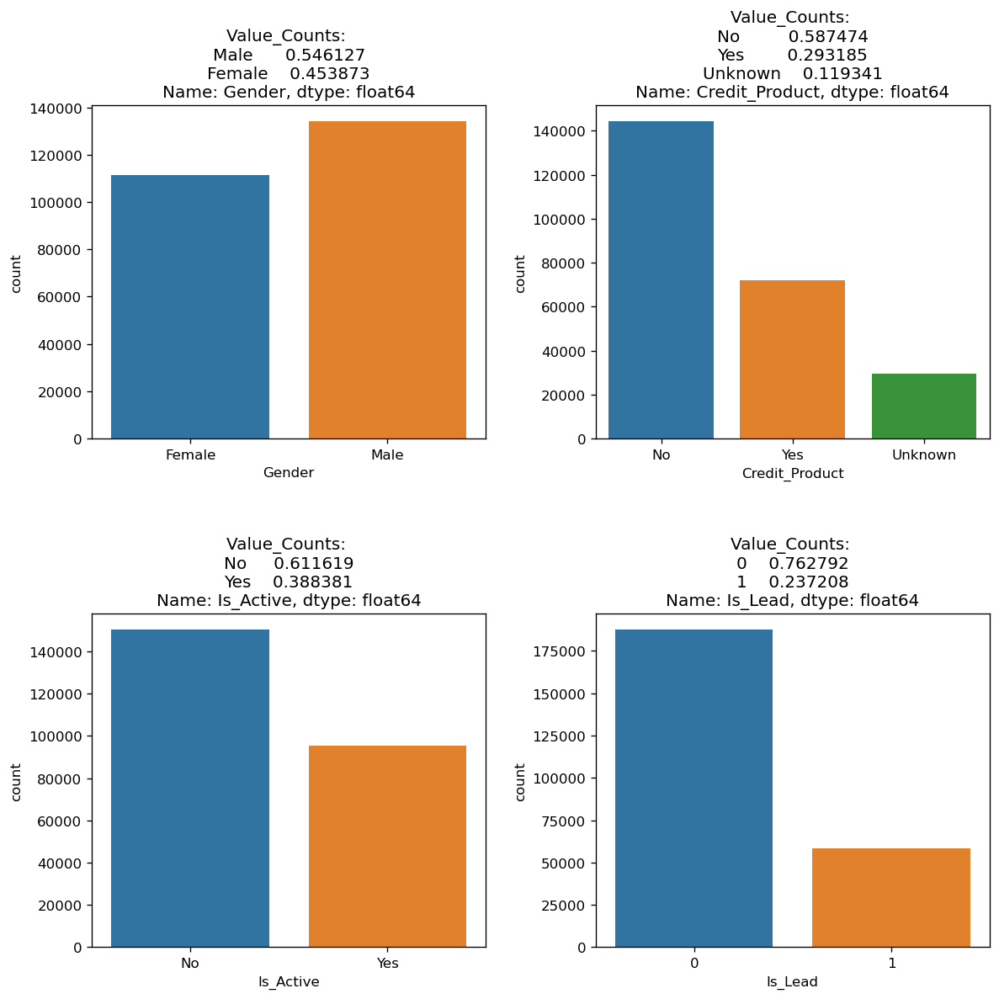

In [21]:
plt.figure(figsize = (10, 10), dpi = 120)
for i in range(len(c1)):
    plt.subplot(2, 2, i+1)
    sns.countplot(ds[c1[i]])
    plt.title(f"Value_Counts: \n{ds[c1[i]].value_counts(normalize = True)}")
plt.tight_layout(h_pad = 4, w_pad = 2)
plt.show()

From the first group of segregated columns, we get the following insights:
* Gender:
    1. We see that 54% of the total customers are male, whereas remaining 46% are female. So, the customers are divided evenly on the basis of gender.
* Credit_Product:
    1. Out of all the customers, the majority have not opted for any type of credit service like caar loan, home loan etc. 
    2. Only 29% of people have taken some kind of credit service from the bank.
    3. For the remaning 12% customers, it is unknown that they have taken some kind of credit product or not.
* Is_Active:
    1. About 61% of the customers were very active in the lastg 3 months. Only 39% of the toatal customers were inactive.
* Is_Lead:
    * We see that out of all the customers, majority of them have not taken any credit card or opted for credit card services. 23% have taken the credit card from the bank.
    
**Moving forward:**
* Does the gender have any effect on the target variable. Are males more likely to take a credit card than females.
* Do the customers who have not taken any kind of credit product tend to opt for credit card more than customers with credit product active
* Are customers who are more active in last 3 months take more credit cards than the inactive ones.

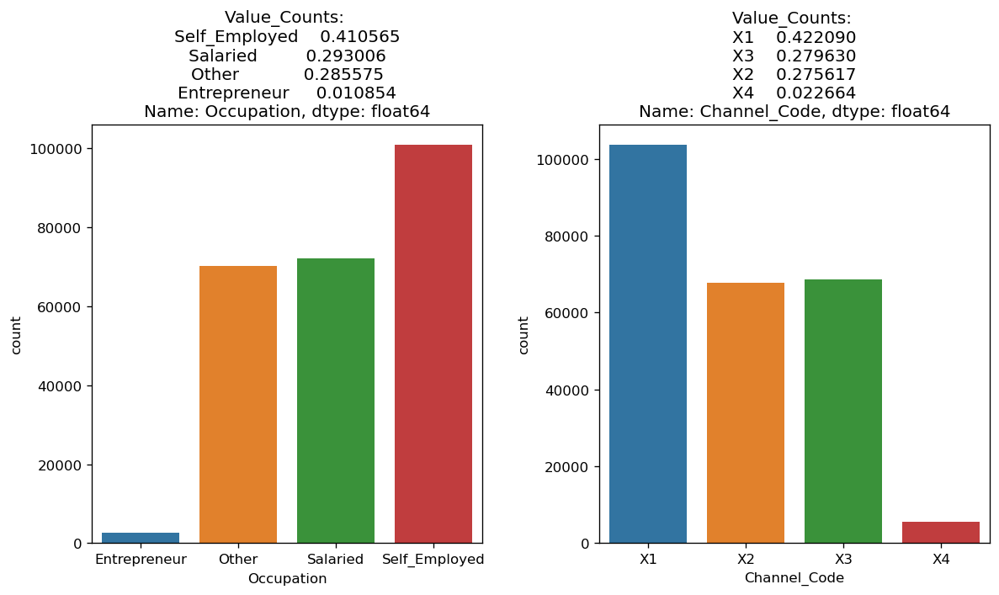

In [22]:
plt.figure(figsize = (10, 6), dpi = 120)
for i in range(len(c2)):
    plt.subplot(1, 2, i+1)
    sns.countplot(ds[c2[i]])
    plt.title(f"Value_Counts: \n{ds[c2[i]].value_counts(normalize = True)}")
plt.tight_layout(h_pad = 4, w_pad = 2)
plt.show()

* Occupation:
    1. Most of the customers(around 41%) are self employed.
    2. Only 1% of the customers out of all the customers are entreprenuers. Thsi might explain the presence of outliers in the 'Avg_account_Balance' column.
    3. Rest of the lot are either Salaried(29%) or have some other occupation(29%)
* Channel_Code:
    1. X1 is the channel code through whiich the majority of customers were accquired.
    2. Only 2% customers were accquired through the channel code X4

**Moving Ahead**:
* The distribution of data in both Occupation and Channel_Code is very similar. We will see if there is a relation between Channel_code and Occupation.
* Is there any effect on the Is_Lead column due to the occupation of the customer or by channel_code

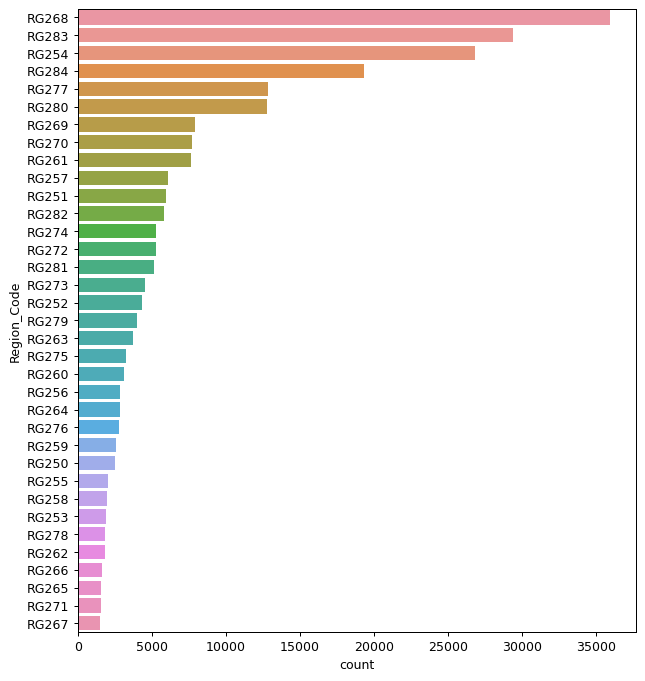

In [23]:
plt.figure(figsize = (8, 9), dpi = 90)
sns.countplot(y = ds[c3[0]], order = ds[c3[0]].value_counts().index)
plt.show()

1. Majority of the customers hail from region code RG268, RG283, RG254, RG284. On the other hand RG267, RG271, RG265, RG266 are the regions where the least amount of people are customers.
2. For better analysis we can divide the the regions into three categories, depending upon the number of customers.

Moving on, we will look at the relationship of the features with the target variable during the Bivariate Analysis.
# Bivariate Analysis:
We start with looking at the **relationship between the numerical columns.**

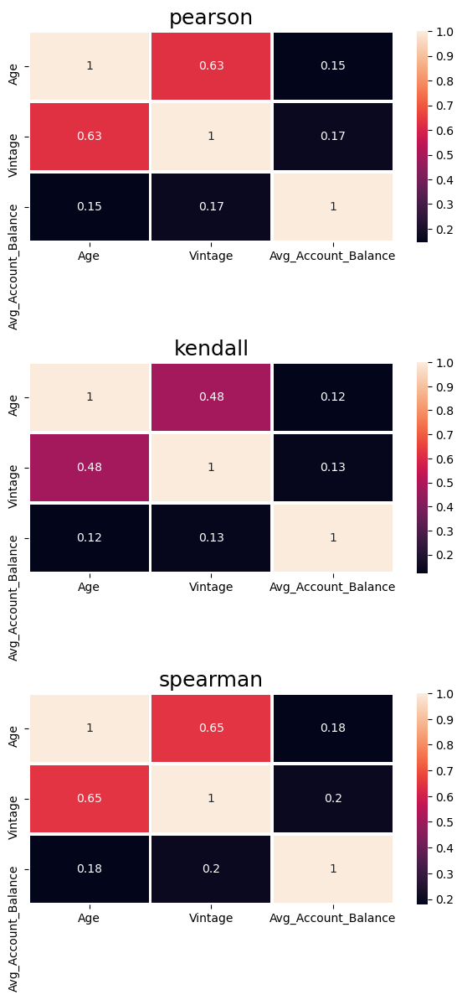

In [24]:
numerical = ds.select_dtypes(include = 'int64')[:]

plt.figure(figsize=(6,12), dpi=100)
for j,i in enumerate(['pearson','kendall','spearman']):
  plt.subplot(3,1,j+1)
  correlation = numerical.dropna().corr(method=i)
  sns.heatmap(correlation,annot = True, linewidth = 2)
  plt.title(i, fontsize=18)
plt.tight_layout()
plt.show()

From the above correlation heatmap, we see that the features 'Age' and 'Vintage' are very correlated with eact other.

# Categorical-Categorical Relation:
Under this bivariate analysis, we will look at different hypothesis and then check if the hypothesis are true or not. List of hypothesis that we want to check are:
* Are Males more likely to take credit card then females?
* Are young customers more likely to opt for credit card?
* Does entrepreneurs take credit card more often than other occupations?
* Does customers joining through one channel code opt for credit card more than the others?
* Do the customers who are more active will take more credit cards then the less active customers?
* Will people with any kind of credit product active take more credit cards then the people without credit product?

In [25]:
def BVA_categorical_plot(data, tar, cat):
  '''
  take data and two categorical variables,
  calculates the chi2 significance between the two variables 
  and prints the result with countplot & CrossTab
  '''
  #isolating the variables
  data = data[[cat,tar]][:]

  #forming a crosstab
  table = pd.crosstab(data[tar],data[cat],)
  f_obs = np.array([table.iloc[0][:].values,
                    table.iloc[1][:].values])

  #performing chi2 test
  from scipy.stats import chi2_contingency
  chi, p, dof, expected = chi2_contingency(f_obs)
  
  #checking whether results are significant
  if p<0.05:
    sig = True
  else:
    sig = False

  #plotting grouped plot
  sns.countplot(x=cat, hue=tar, data=data)
  plt.title("p-value = {}\n difference significant? = {}\n".format(round(p,8),sig))

  #plotting percent stacked bar plot
  #sns.catplot(ax, kind='stacked')
  ax1 = data.groupby(cat)[tar].value_counts(normalize=True).unstack()
  ax1.plot(kind='bar', stacked='True',title=str(ax1))
  int_level = data[cat].value_counts()

#### 1. Are females less likely to take credit cards than males?

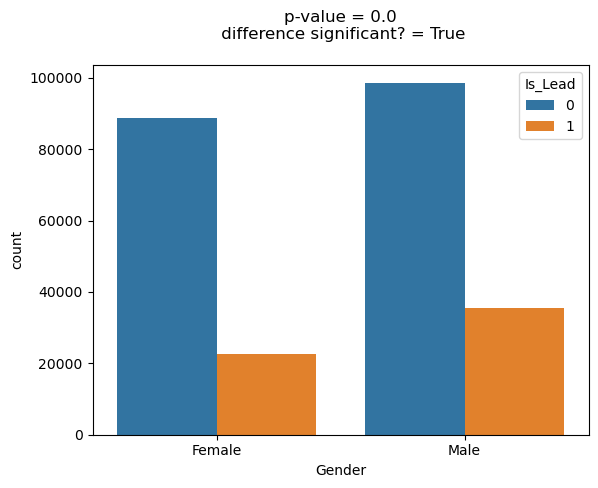

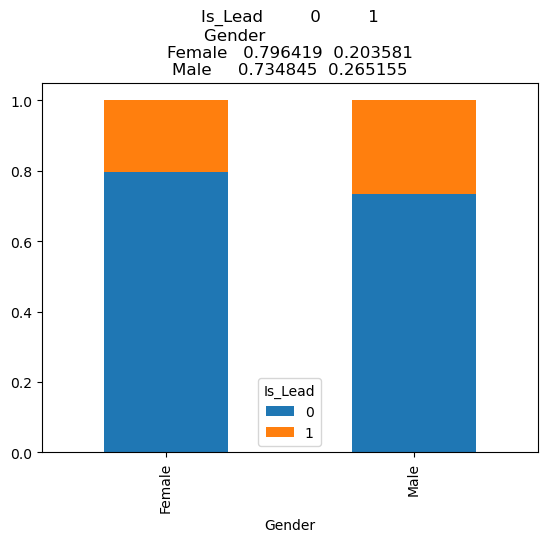

In [26]:
BVA_categorical_plot(ds, 'Is_Lead', 'Gender')

As the p value is very very less(almost 0), the difference between the male and female customers opting for the credit cards is very significant.

#### Are young customers more likely to opt for credit card?
For this, we will divide the age feature into the four groups:

In [27]:
churn = ds[['Is_Lead','Age']][:]
churn['age_group'] = 'str'
churn['age_group'][churn['Age']>=80] = 'very old'
churn['age_group'][(churn['Age']<80) & (churn['Age']>=60)] = 'senior citizen'
churn['age_group'][(churn['Age']<60) & (churn['Age']>=18)] = 'adult'
churn['age_group'][churn['Age']<18] = 'young'

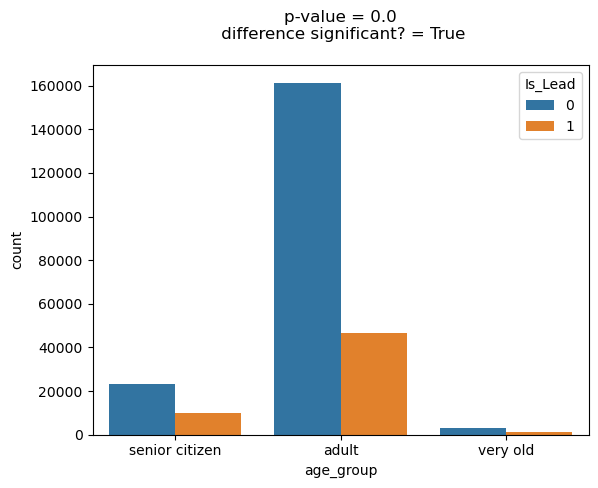

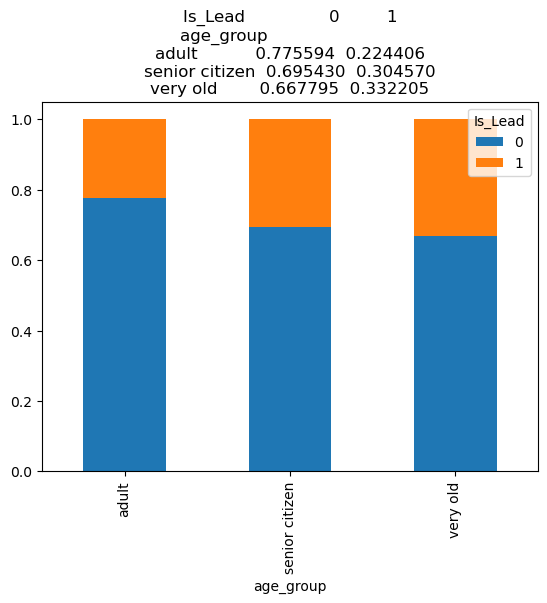

In [28]:
BVA_categorical_plot(churn, 'Is_Lead', 'age_group')

As we see again from the results of the chi-square test that the difference between the age groups is highly significant in determining the target_variable. On average, the people that belong to the adult age group or the whose age is between 18 to 60 are more likely to opt for the credit card.
#### Does entrepreneurs take credit card more often than other occupations?

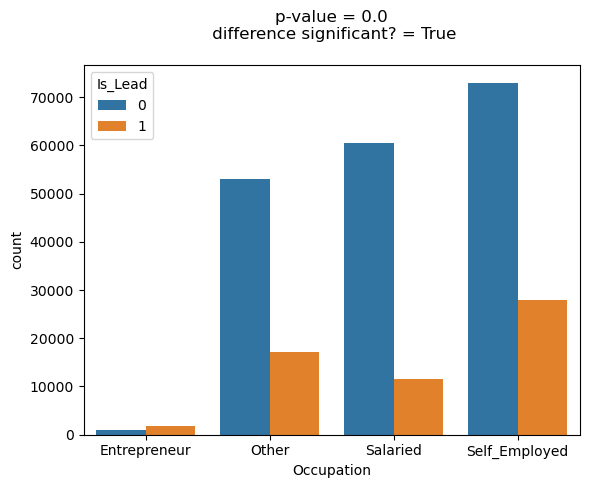

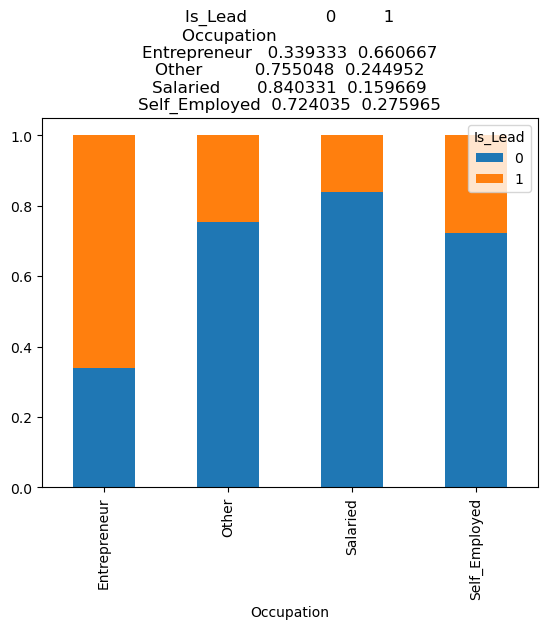

In [29]:
BVA_categorical_plot(ds, 'Is_Lead', 'Occupation')

We see that the different occupations of customers have significant effect for 'Is_Lead' variable.
#### Does customers joining through one channel code opt for credit card more than the others?

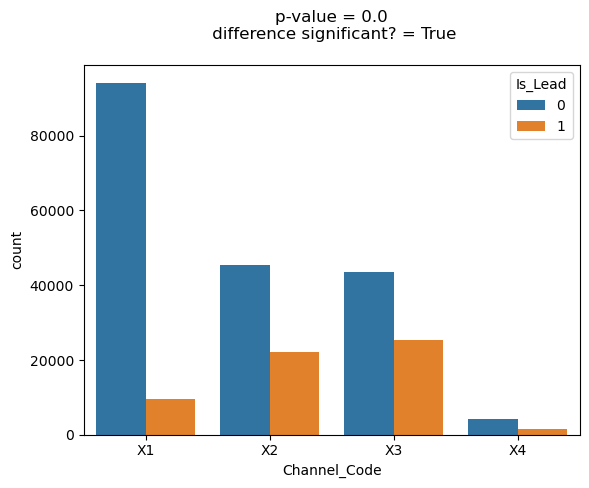

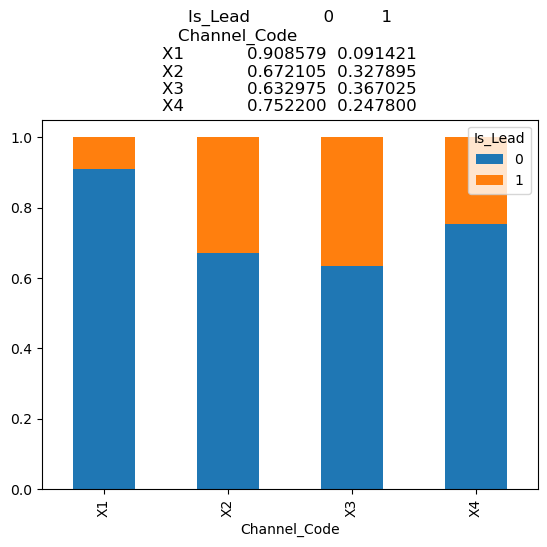

In [30]:
BVA_categorical_plot(ds, 'Is_Lead', 'Channel_Code')

Again we have a significant difference in target variable in accordance with the channel code.
#### Do the customers who are more active will take more credit cards then the less active customers?

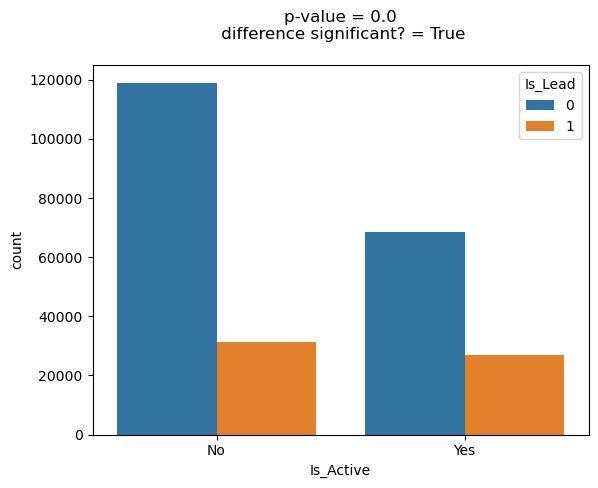

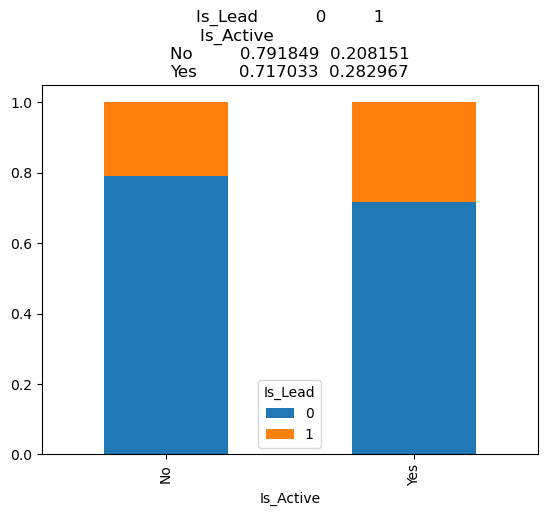

In [31]:
BVA_categorical_plot(ds, 'Is_Lead', 'Is_Active')

#### Will people with any kind of credit product active take more credit cards then the people without credit product?

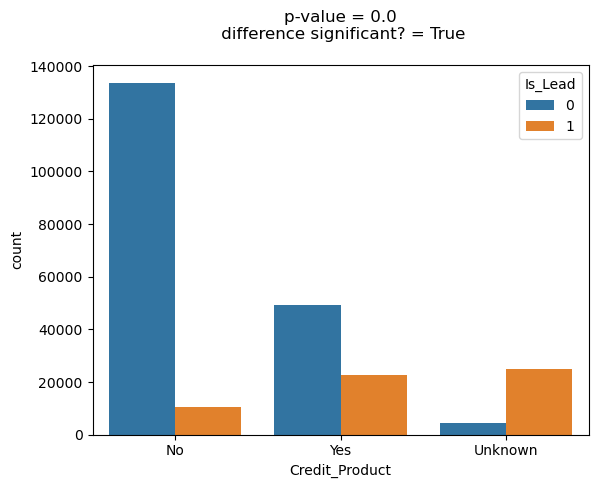

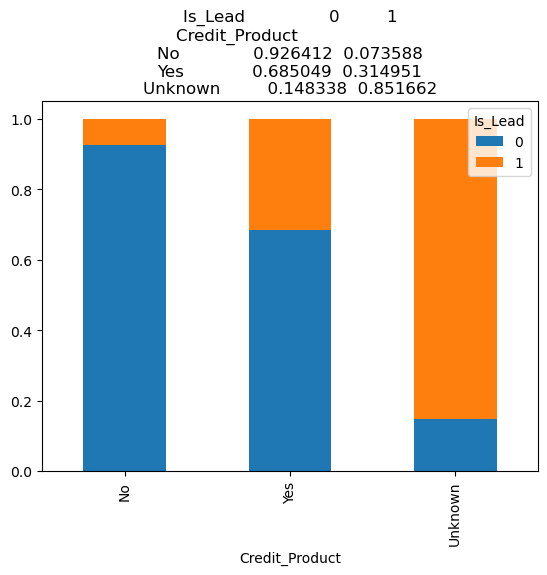

In [32]:
BVA_categorical_plot(ds, 'Is_Lead', 'Credit_Product')

From the above relationships between the categorical columns and target variables, we see that the all of the categorical columns have a significant efect on the target which is 'Is_Lead'.
# Continuous-Categorical Relation:
Now we will check the hypothesis that we had for the continous columns and check if they are true or not.

In [33]:
def TwoSampT(X1, X2, sd1, sd2, n1, n2):
  '''
  takes mean, standard deviation, and number of observations and returns p-value calculated for 2-sample T-Test
  '''
  from numpy import sqrt, abs, round
  from scipy.stats import t as t_dist
  ovr_sd = sqrt(sd1**2/n1 + sd2**2/n2)
  t = (X1 - X2)/ovr_sd
  df = n1+n2-2
  pval = 2*(1 - t_dist.cdf(abs(t),df))
  return pval

In [34]:
def Bivariate_cont_cat(data, cont, cat, category):
  #creating 2 samples
  x1 = data[cont][data[cat]==category][:]
  x2 = data[cont][~(data[cat]==category)][:]
  
  #calculating descriptives
  n1, n2 = x1.shape[0], x2.shape[0]
  m1, m2 = x1.mean(), x2.mean()
  std1, std2 = x1.std(), x2.mean()
  
  #calculating p-values
  t_p_val = TwoSampT(m1, m2, std1, std2, n1, n2)

  #table
  table = pd.pivot_table(data=data, values=cont, columns=cat, aggfunc = np.mean)

  #plotting
  plt.figure(figsize = (15,6), dpi=140)
  
  #barplot
  plt.subplot(1,2,1)
  sns.barplot([str(category),'not {}'.format(category)], [m1, m2])
  plt.ylabel('mean {}'.format(cont))
  plt.xlabel(cat)
  plt.title(f'p-value for t-test: {t_p_val}\n{table}')

  # boxplot
  plt.subplot(1,2,2)
  sns.boxplot(x=cat, y=cont, data=data)
  plt.title('categorical boxplot')

#### Are old customers less likely to take credit card?

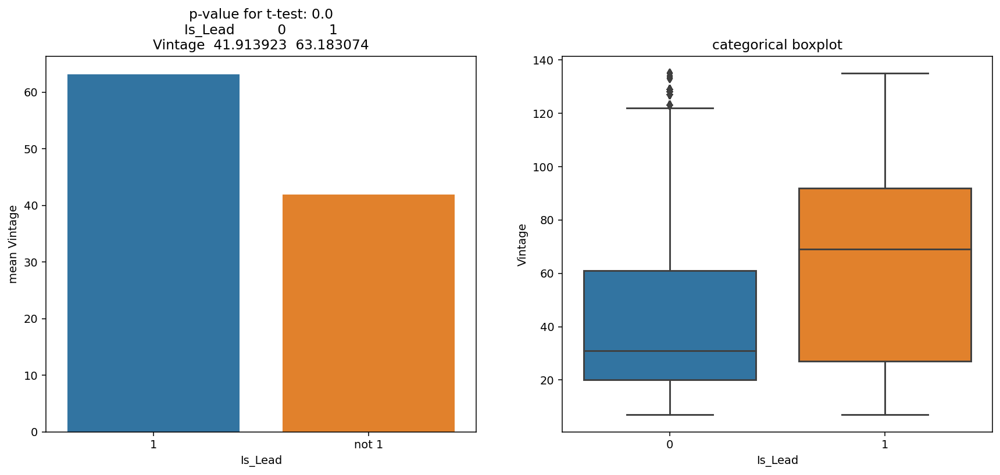

In [35]:
Bivariate_cont_cat(ds, 'Vintage', 'Is_Lead', 1)

From theabove countplot and boxplots:
1. We can see that the customers who have taken the credit card have a higher mean vintage or they have been the with the bank more that the customers who have not taken the credit card. 
2. Also for the customers who have taken the credit card, the average vintage duration is about 68 months
3. For those who have not taken any credit card the average vintage duration is about 40 months.
4. There is a difference of about 28 months between these two.

#### Are customers with higher average balance less likely to take credit card?

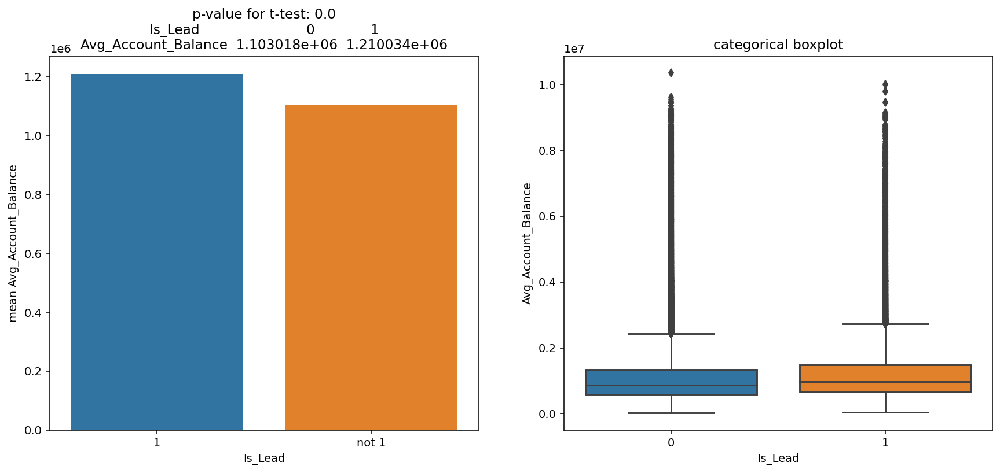

In [36]:
Bivariate_cont_cat(ds, 'Avg_Account_Balance', 'Is_Lead', 1)

p-value is again less then the critical value, which means that the customers with more account balance are more likely to take the credit cards. We can also visualise it using the countplot and boxplots.